In [1]:
import geopandas as gpd
import pandas as pd
import rasterio
from rasterio.plot import show as rastershow
import os
from matplotlib import pyplot as plt
import numpy as np
from shapely import Polygon, Point
import shapely
import rioxarray
from PIL import Image
import re

In [2]:
import seaborn as sns

In [3]:
from matplotlib import colormaps

In [4]:
import sys
sys.path.append('../../')
from deeptrees.modules.postprocessing import calculate_feature_map, calculate_probability_map, calculate_entropy

/home/k/k202141/.conda/envs/deeptree/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
sns.set_style('ticks')

## Ground truth

- Baumkataster
- Segmented tree maps

In [6]:
baumkataster = gpd.read_file('/home/k/k202141/workdir/shared_data/2024-ufz-deeptree/halle-baumkataster/itc005211130105323_point.shp')
baumkataster = baumkataster.to_crs(epsg=25832) # need this in the same coordinate system
baumkataster.head()

,standort,hoehe_m,baum_nr,krone_m,stammu_cm,art_deu,gid,pflanzjahr,art_botan,strasse,geometry
0,None,2 - 5,000001,2 - 5,18.0,Kleinkronige Winterlinde,69872,2018.0,Tilia cordata 'Rancho',Max-Sauerlandt-Ring,POINT (702588.616 5710928.347)
1,None,None,000001,None,NaN,None,69850,NaN,None,None,POINT (702737.05 5708872.125)
2,Straße,2 - 5,000002,2 - 5,20.0,Winter-Linde,69874,2020.0,Tilia cordata,Max-Sauerlandt-Ring,POINT (702583.404 5710940.491)
3,None,2 - 5,000003,None,18.0,Kleinkronige Winterlinde,69875,2018.0,Tilia cordata 'Rancho',Max-Sauerlandt-Ring,POINT (702578.018 5710953.036)
4,None,2 - 5,000004,None,18.0,Kleinkronige Winterlinde,69876,2018.0,Tilia cordata 'Rancho',Max-Sauerlandt-Ring,POINT (702573.288 5710963.769)


In [7]:
segmented_trees = gpd.read_file('/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/labels/all_labels.shp')
segmented_trees.head()

,class,id,geometry
0,0.0,NaN,"POLYGON ((704006.919 5709953.981, 704007.922 5..."
1,0.0,NaN,"POLYGON ((704029.35 5709936.794, 704030.126 57..."
2,0.0,NaN,"POLYGON ((704032.327 5709930.838, 704032.781 5..."
3,0.0,NaN,"POLYGON ((704041.52 5709926.631, 704043.268 57..."
4,0.0,NaN,"POLYGON ((704005.203 5709932.327, 704006.951 5..."


## Functions

In [8]:
def calc_iou(pred_frame, true_frame):
    pred_polygons = pred_frame['geometry'].union_all()
    true_polygons = true_frame['geometry'].union_all()
    
    inters = shapely.intersection(pred_polygons, true_polygons)
    union = shapely.union(pred_polygons, true_polygons)

    return inters.area / union.area
    

In [9]:
def calc_panoptic_segmentation(pred_frame, true_frame, iou_threshold=0.5):
    '''
    Panoptic segmentation metric
    '''
    def instance_iou(poly1, poly2):
        inters = poly1.intersection(poly2).area
        union = poly1.union(poly2).area
        return inters / union if union > 0 else 0

    # Store matches between pred and truth
    matched_pairs = []
    true_polygons_used = set()
    predicted_polygons_used = set()

    for pred_idx, pred_row in pred_frame.iterrows():
        best_match = None
        best_iou = 0
        for true_idx, true_row in true_frame.iterrows():
            if true_idx in true_polygons_used:
                continue
            iou = instance_iou(pred_row.geometry, true_row.geometry)
            if iou > best_iou and iou >= iou_threshold:
                best_match = true_idx
                best_iou = iou

        if best_match is not None:
            matched_pairs.append((pred_idx, best_match, best_iou))
            true_polygons_used.add(best_match)
            predicted_polygons_used.add(pred_idx)


    tp = len(matched_pairs)
    fp = len(pred_frame) - tp
    fn = len(true_frame) - tp
    iou_sum = sum(iou for _, _, iou in matched_pairs)

    denom = tp + 0.5*fp + 0.5*fn
    if denom == 0:
        return 0, tp, fp, fn

    return iou_sum / denom, tp, fp, fn

    

In [10]:
def restrict_frame_to_raster(frame, raster):
    zoom_box = {'left': raster.bounds.left, 'right': raster.bounds.right, 'bottom': raster.bounds.bottom, 'top': raster.bounds.top}
    zbox0 = Polygon( (Point(zoom_box['left'], zoom_box['bottom']), Point(zoom_box['right'], zoom_box['bottom']), Point(zoom_box['right'], zoom_box['top']), Point(zoom_box['left'], zoom_box['top']), ) )

    return frame[frame.within(zbox0)]

In [11]:
def blend_raster_entropy_map(tile_id, pool_dir, cmap='magma'):
    my_cmap = colormaps.get(cmap)
    pool_tile = f'/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/pool_tiles/tile_{tile_id}.tif'
    emap = os.path.join(pool_dir, f'entropy_heatmap_{tile_id}.tif')

    rpool = rioxarray.open_rasterio(pool_tile).isel(band=slice(0, 3))
    remap = rioxarray.open_rasterio(emap)
    arr = (my_cmap(remap.data) * 255).astype(np.uint8)

    ipool = Image.fromarray(rpool.data.transpose(1, 2, 0)).convert('RGBA')
    iemap = Image.fromarray(arr.squeeze(), 'RGBA')

    return Image.blend(ipool, iemap, alpha=0.75)

## Predicted polygons (labeled test set)

In [12]:
tile_root = '/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/test_tiles/'
tiles = np.sort(os.listdir(tile_root))

In [13]:
eval_dict = {'tile': [], 'run': [], 'iou': [], 'bk_tp': [], 'bk_fn': [], 'num_tree_crowns': [], 'panoptic_segmentation': [], 'poly_tp': [], 'poly_fp': [], 'poly_fn': []}

In [14]:
for tile in tiles:
    raster = rasterio.open(os.path.join(tile_root, tile))
    
    st = restrict_frame_to_raster(segmented_trees, raster)
    gt = restrict_frame_to_raster(baumkataster, raster)
    
    # calculate metrics
    iou = calc_iou(st, st)
    
    eval_dict['tile'].append(tile)
    eval_dict['run'].append('ground_truth_segmentation')
    eval_dict['iou'].append(iou)
    eval_dict['num_tree_crowns'].append(len(st))
    eval_dict['bk_tp'].append(len(st.sjoin(baumkataster)))
    eval_dict['bk_fn'].append(len(gt) - len(st.sjoin(baumkataster)))
    ps, tp, fp, fn = calc_panoptic_segmentation(st, st)
    eval_dict['panoptic_segmentation'].append(ps)
    eval_dict['poly_tp'].append(tp)
    eval_dict['poly_fp'].append(fp)
    eval_dict['poly_fn'].append(fn)

In [15]:
for tile in tiles:
    raster = rasterio.open(os.path.join(tile_root, tile))
    
    gt = restrict_frame_to_raster(baumkataster, raster)
    
    eval_dict['tile'].append(tile)
    eval_dict['run'].append('ground_truth_baumkataster')
    eval_dict['iou'].append(None)
    eval_dict['num_tree_crowns'].append(None)
    eval_dict['bk_tp'].append(len(gt))
    eval_dict['bk_fn'].append(0)
    ps, tp, fp, fn = calc_panoptic_segmentation(gt, gt)
    eval_dict['panoptic_segmentation'].append(ps)
    eval_dict['poly_tp'].append(tp)
    eval_dict['poly_fp'].append(fp)
    eval_dict['poly_fn'].append(fn)
    

## View test tiles

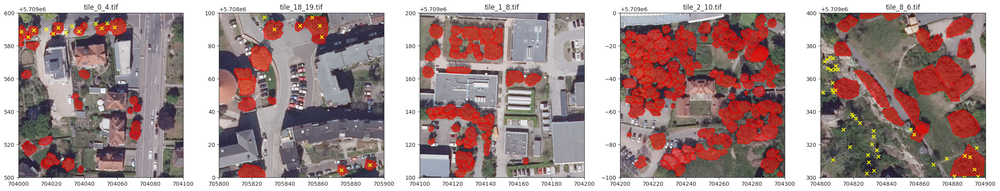

In [16]:
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

for ax, tile in zip(axs, tiles):
    raster = rasterio.open(os.path.join(tile_root, tile))
    
    st = restrict_frame_to_raster(segmented_trees, raster)
    gt = restrict_frame_to_raster(baumkataster, raster)

    rastershow(raster, ax=ax)
    if len(st) > 0:
        st.plot(ax=ax, edgecolor='red', lw=2, facecolor='red', alpha=0.5, label='true')
    if len(gt) > 0:
        gt.plot(ax=ax, marker='x', color='yellow')
    ax.set_title(f'{tile}')


fig.tight_layout()
plt.savefig('./symposium_plots/test_tiles_ground_truth_baumkataster.png', bbox_inches='tight')

### With pretrained TCD model, averaged across all 5 models

In [17]:
poly_pretrained_averaged = gpd.read_file('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-labeled-pretrained-halle/2024-11-27_14-17-33/treecrowns.sqlite')

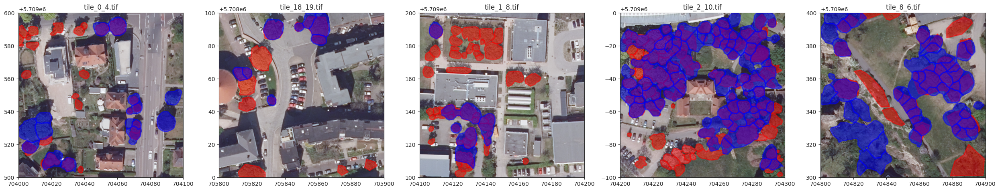

In [18]:
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

for ax, tile in zip(axs, tiles):
    raster = rasterio.open(os.path.join(tile_root, tile))
    
    st = restrict_frame_to_raster(segmented_trees, raster)
    gt = restrict_frame_to_raster(baumkataster, raster)
    pt = restrict_frame_to_raster(poly_pretrained_averaged, raster)

    rastershow(raster, ax=ax)
    if len(st) > 0:
        st.plot(ax=ax, edgecolor='red', lw=2, facecolor='red', alpha=0.5, label='true')
    if len(pt) > 0:
        pt.plot(ax=ax, edgecolor='blue', lw=2, facecolor='blue', alpha=0.5, label='pred')
    ax.set_title(f'{tile}')

    # calculate metrics
    iou = calc_iou(pt, st)
    
    eval_dict['tile'].append(tile)
    eval_dict['run'].append('pretrained_averaged')
    eval_dict['iou'].append(iou)
    eval_dict['num_tree_crowns'].append(len(pt))
    eval_dict['bk_tp'].append(len(pt.sjoin(baumkataster)))
    eval_dict['bk_fn'].append(len(gt) - len(pt.sjoin(baumkataster)))
    ps, tp, fp, fn = calc_panoptic_segmentation(pt, st)
    eval_dict['panoptic_segmentation'].append(ps)
    eval_dict['poly_tp'].append(tp)
    eval_dict['poly_fp'].append(fp)
    eval_dict['poly_fn'].append(fn)

fig.tight_layout()
plt.savefig('./symposium_plots/test_pretrained_averaged.png', bbox_inches='tight')

### With pretrained TCD model, single model

In [19]:
poly_pretrained_single = gpd.read_file('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-labeled-pretrained-halle/2024-11-28_12-29-42/treecrowns.sqlite')

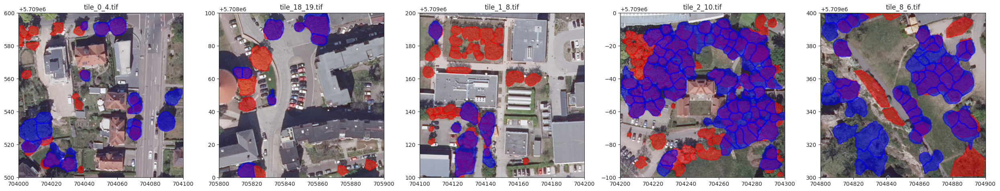

In [20]:
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

for ax, tile in zip(axs, tiles):
    raster = rasterio.open(os.path.join(tile_root, tile))
    
    st = restrict_frame_to_raster(segmented_trees, raster)
    gt = restrict_frame_to_raster(baumkataster, raster)
    pt = restrict_frame_to_raster(poly_pretrained_single, raster)

    rastershow(raster, ax=ax)
    if len(st) > 0:
        st.plot(ax=ax, edgecolor='red', lw=2, facecolor='red', alpha=0.5, label='true')
    if len(pt) > 0:
        pt.plot(ax=ax, edgecolor='blue', lw=2, facecolor='blue', alpha=0.5, label='pred')
    ax.set_title(f'{tile}')

    # calculate metrics
    iou = calc_iou(pt, st)
    
    eval_dict['tile'].append(tile)
    eval_dict['run'].append('pretrained_single')
    eval_dict['iou'].append(iou)
    eval_dict['num_tree_crowns'].append(len(pt))
    eval_dict['bk_tp'].append(len(pt.sjoin(baumkataster)))
    eval_dict['bk_fn'].append(len(gt) - len(pt.sjoin(baumkataster)))
    ps, tp, fp, fn = calc_panoptic_segmentation(pt, st)
    eval_dict['panoptic_segmentation'].append(ps)
    eval_dict['poly_tp'].append(tp)
    eval_dict['poly_fp'].append(fp)
    eval_dict['poly_fn'].append(fn)

fig.tight_layout()
plt.savefig('./symposium_plots/test_pretrained_single.png', bbox_inches='tight')

### With finetuned model, averaged across all 5 models

In [21]:
poly_finetuned_averaged = gpd.read_file('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-labeled-finetuned-halle/2024-11-27_14-39-31/treecrowns.sqlite')

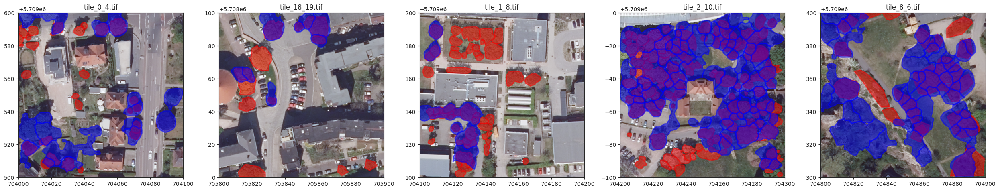

In [22]:
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

for ax, tile in zip(axs, tiles):
    raster = rasterio.open(os.path.join(tile_root, tile))

    st = restrict_frame_to_raster(segmented_trees, raster)
    gt = restrict_frame_to_raster(baumkataster, raster)
    pt = restrict_frame_to_raster(poly_finetuned_averaged, raster)

    rastershow(raster, ax=ax)
    if len(st) > 0:
        st.plot(ax=ax, edgecolor='red', lw=2, facecolor='red', alpha=0.5, label='true')
    if len(pt) > 0:
        pt.plot(ax=ax, edgecolor='blue', lw=2, facecolor='blue', alpha=0.5, label='pred')
    ax.set_title(f'{tile}')

    # calculate metrics
    iou = calc_iou(pt, st)
    
    eval_dict['tile'].append(tile)
    eval_dict['run'].append('finetuned_averaged')
    eval_dict['iou'].append(iou)
    eval_dict['num_tree_crowns'].append(len(pt))
    eval_dict['bk_tp'].append(len(pt.sjoin(baumkataster)))
    eval_dict['bk_fn'].append(len(gt) - len(pt.sjoin(baumkataster)))
    ps, tp, fp, fn = calc_panoptic_segmentation(pt, st)
    eval_dict['panoptic_segmentation'].append(ps)
    eval_dict['poly_tp'].append(tp)
    eval_dict['poly_fp'].append(fp)
    eval_dict['poly_fn'].append(fn)

fig.tight_layout()
plt.savefig('./symposium_plots/test_finetuned_averaged.png', bbox_inches='tight')

### With finetuned model, only one model

In [23]:
poly_finetuned_single = gpd.read_file('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-labeled-finetuned-halle/2024-11-28_12-12-46/treecrowns.sqlite')

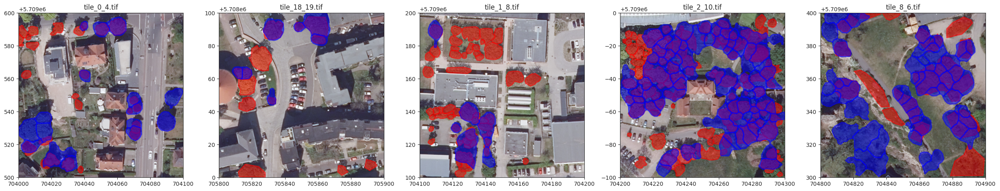

In [24]:
fig, axs = plt.subplots(1, 5, figsize=(25, 5))

for ax, tile in zip(axs, tiles):
    raster = rasterio.open(os.path.join(tile_root, tile))

    st = restrict_frame_to_raster(segmented_trees, raster)
    gt = restrict_frame_to_raster(baumkataster, raster)
    pt = restrict_frame_to_raster(poly_finetuned_single, raster)

    rastershow(raster, ax=ax)
    if len(st) > 0:
        st.plot(ax=ax, edgecolor='red', lw=2, facecolor='red', alpha=0.5, label='true')
    if len(pt) > 0:
        pt.plot(ax=ax, edgecolor='blue', lw=2, facecolor='blue', alpha=0.5, label='pred')
    ax.set_title(f'{tile}')

    # calculate metrics
    iou = calc_iou(pt, st)
    
    eval_dict['tile'].append(tile)
    eval_dict['run'].append('finetuned_single')
    eval_dict['iou'].append(iou)
    eval_dict['num_tree_crowns'].append(len(pt))
    eval_dict['bk_tp'].append(len(pt.sjoin(baumkataster)))
    eval_dict['bk_fn'].append(len(gt) - len(pt.sjoin(baumkataster)))
    ps, tp, fp, fn = calc_panoptic_segmentation(pt, st)
    eval_dict['panoptic_segmentation'].append(ps)
    eval_dict['poly_tp'].append(tp)
    eval_dict['poly_fp'].append(fp)
    eval_dict['poly_fn'].append(fn)

fig.tight_layout()
plt.savefig('./symposium_plots/test_finetuned_single.png', bbox_inches='tight')

## Compare pretrained vs finetuned

In [25]:
eval_frame = pd.DataFrame(eval_dict)

In [26]:
eval_frame

,tile,run,iou,bk_tp,bk_fn,num_tree_crowns,panoptic_segmentation,poly_tp,poly_fp,poly_fn
0,tile_0_4.tif,ground_truth_segmentation,1.000000,8,5,26.0,1.000000,26,0,0
1,tile_18_19.tif,ground_truth_segmentation,1.000000,7,1,12.0,1.000000,12,0,0
2,tile_1_8.tif,ground_truth_segmentation,1.000000,0,0,52.0,1.000000,52,0,0
3,tile_2_10.tif,ground_truth_segmentation,1.000000,0,0,129.0,1.000000,129,0,0
4,tile_8_6.tif,ground_truth_segmentation,1.000000,5,36,16.0,1.000000,16,0,0
5,tile_0_4.tif,ground_truth_baumkataster,NaN,13,0,NaN,0.000000,0,13,13
6,tile_18_19.tif,ground_truth_baumkataster,NaN,8,0,NaN,0.000000,0,8,8
7,tile_1_8.tif,ground_truth_baumkataster,NaN,0,0,NaN,0.000000,0,0,0
8,tile_2_10.tif,ground_truth_baumkataster,NaN,0,0,NaN,0.000000,0,0,0
9,tile_8_6.tif,ground_truth_baumkataster,NaN,41,0,NaN,0.000000,0,41,41


In [27]:
eval_frame.groupby('run')['iou'].mean()

run
finetuned_averaged           0.336464
finetuned_single             0.351137
ground_truth_baumkataster         NaN
ground_truth_segmentation    1.000000
pretrained_averaged          0.367668
pretrained_single            0.372882
Name: iou, dtype: float64

In [28]:
eval_frame.groupby('run')['panoptic_segmentation'].mean()

run
finetuned_averaged           0.082053
finetuned_single             0.130721
ground_truth_baumkataster    0.000000
ground_truth_segmentation    1.000000
pretrained_averaged          0.126722
pretrained_single            0.139105
Name: panoptic_segmentation, dtype: float64

In [29]:
eval_frame.groupby('run')['poly_tp'].mean()

run
finetuned_averaged            4.6
finetuned_single              6.6
ground_truth_baumkataster     0.0
ground_truth_segmentation    47.0
pretrained_averaged           5.2
pretrained_single             6.4
Name: poly_tp, dtype: float64

In [30]:
eval_frame.groupby('run')['poly_fp'].mean()

run
finetuned_averaged           27.4
finetuned_single             25.4
ground_truth_baumkataster    12.4
ground_truth_segmentation     0.0
pretrained_averaged          24.6
pretrained_single            24.6
Name: poly_fp, dtype: float64

In [31]:
eval_frame.groupby('run')['poly_fn'].mean()

run
finetuned_averaged           42.4
finetuned_single             40.4
ground_truth_baumkataster    12.4
ground_truth_segmentation     0.0
pretrained_averaged          41.8
pretrained_single            40.6
Name: poly_fn, dtype: float64

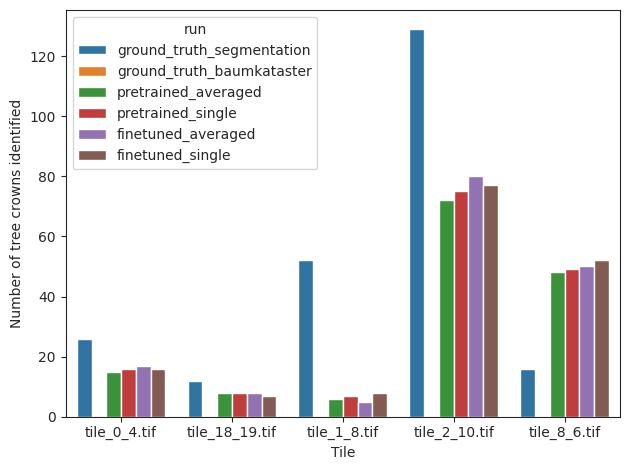

In [32]:
fig, ax = plt.subplots(1, 1)

sns.barplot(data=eval_frame, x='tile', y='num_tree_crowns', hue='run')
ax.set_xlabel('Tile')
ax.set_ylabel('Number of tree crowns identified')

fig.tight_layout()
plt.savefig('./symposium_plots/num_tree_crowns.png', bbox_inches='tight')

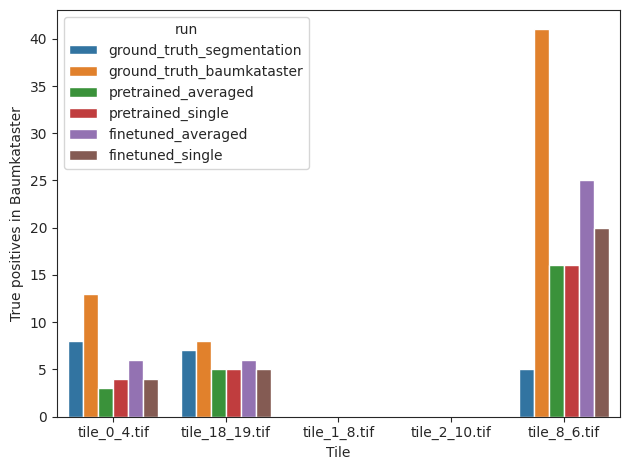

In [33]:
fig, ax = plt.subplots(1, 1)

sns.barplot(data=eval_frame, x='tile', y='bk_tp', hue='run')
ax.set_xlabel('Tile')
ax.set_ylabel('True positives in Baumkataster')

fig.tight_layout()
plt.savefig('./symposium_plots/bk_tp.png', bbox_inches='tight')

## Pool tiles

### With pretrained TCD model, averaged across all 5 models

In [34]:
pool_dir = '/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-pool-pretrained-halle/2024-11-27_15-04-51/'

### With finetuned model, averaged across all 5 models

In [35]:
pool_dir = '/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-pool-finetuned-halle/2024-11-27_15-09-18/entropy_maps/'

In [36]:
mean_entropies = []
max_entropies = []
xmins = []
ymins = []

emaps = np.sort([dd for dd in os.listdir(pool_dir) if dd.endswith('.tif')])
for emap in emaps:
    arr = rioxarray.open_rasterio(os.path.join(pool_dir, emap))
    mean_entropies.append(arr.mean())
    max_entropies.append(arr.max())
    xmins.append(arr.x[0].data)
    ymins.append(arr.y[0].data)

mean_entropies = np.asarray(mean_entropies)
max_entropies = np.asarray(max_entropies)
xmins = np.asarray(xmins)
ymins = np.asarray(ymins)

<Axes: ylabel='Density'>

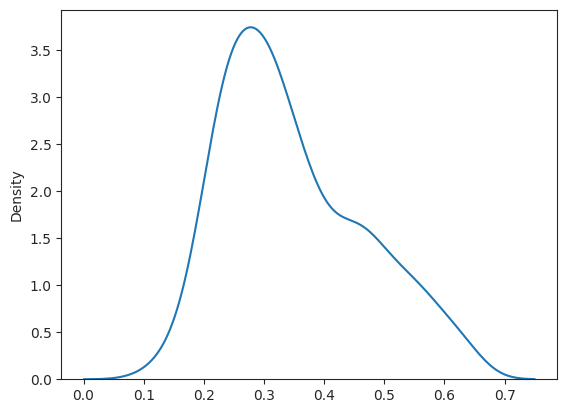

In [37]:
sns.kdeplot(mean_entropies)

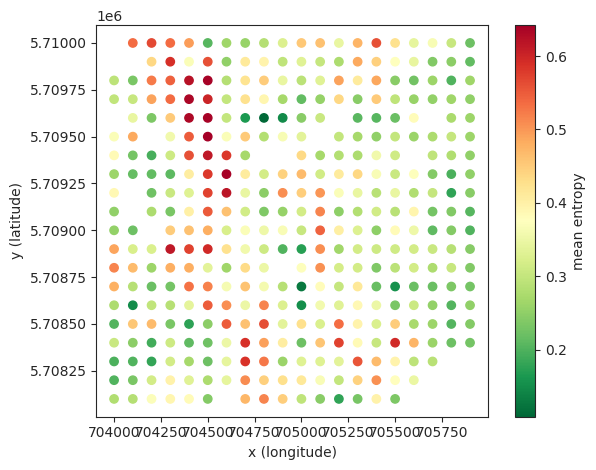

In [38]:
fig, ax = plt.subplots(1, 1)
img = ax.scatter(xmins, ymins, c=mean_entropies, cmap='RdYlGn_r')
plt.colorbar(img, label='mean entropy')
ax.set_aspect('equal')
ax.set_xlabel('x (longitude)')
ax.set_ylabel('y (latitude)')

fig.tight_layout()
plt.savefig('./symposium_plots/next_tiles_to_label.png', bbox_inches='tight')

In [39]:
idx = np.argsort(mean_entropies)
mean_entropies[idx[:3]], emaps[idx[:3]]

(array([0.10847922, 0.12902257, 0.14793628], dtype=float32),
 array(['entropy_heatmap_8_4.tif', 'entropy_heatmap_10_13.tif',
        'entropy_heatmap_9_4.tif'], dtype='<U25'))

The top most certain and uncertain tiles

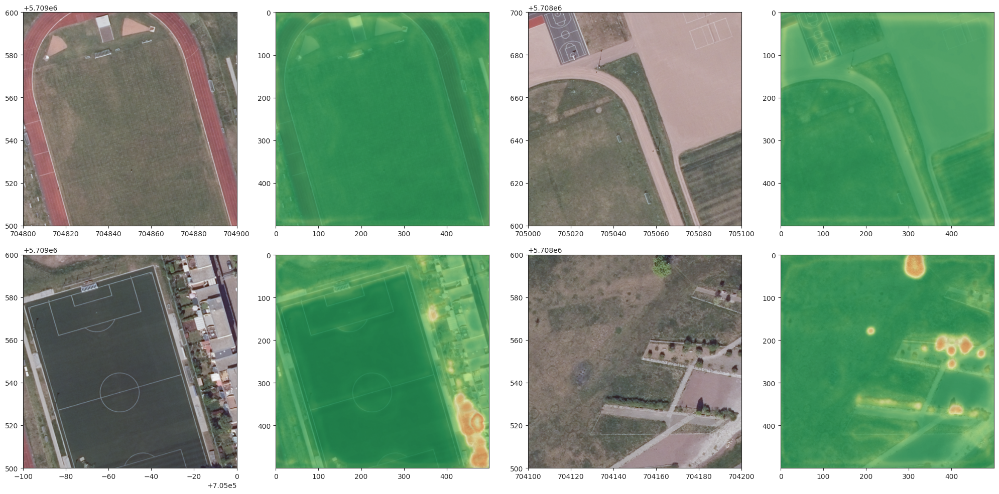

In [40]:
k = 4

fig, ax = plt.subplots(k // 2, k, figsize=(20, 10))
ax = ax.flatten()

for i in range(k):
    tile_id = re.search(r'(\d+_\d+)', emaps[idx[i]]).group()
    raster = rasterio.open(f'/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/pool_tiles/tile_{tile_id}.tif')
    rastershow(raster, ax=ax[int(2*i)])

    blended = blend_raster_entropy_map(tile_id, pool_dir, cmap='RdYlGn_r')
    ax[int(2*i+1)].imshow(np.asarray(blended), vmin=0, vmax=255)

fig.tight_layout()
plt.savefig('./symposium_plots/pool_tiles_most_certain.png', bbox_inches='tight')

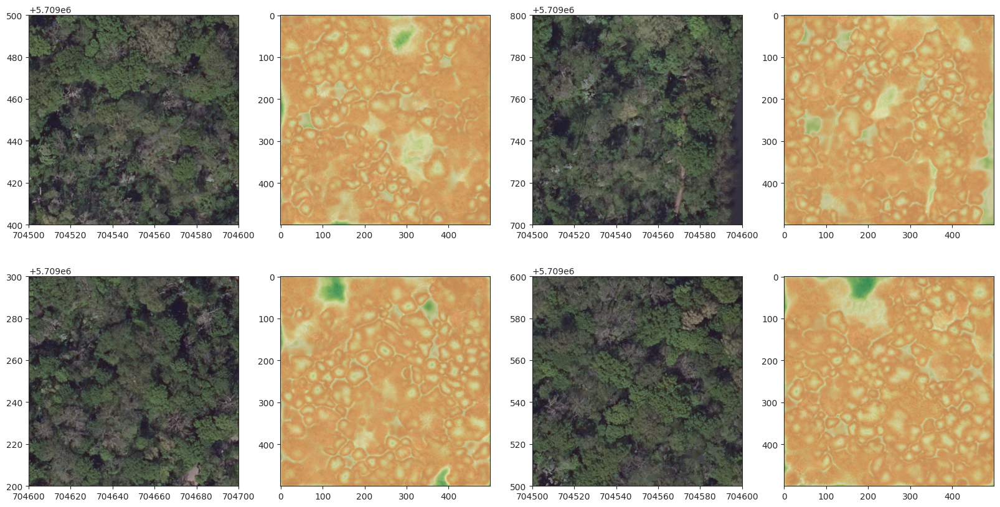

In [41]:
k = 4

fig, ax = plt.subplots(k // 2, k, figsize=(20, 10))
ax = ax.flatten()

for i in range(k):
    tile_id = re.search(r'(\d+_\d+)', emaps[idx[-(i + 1)]]).group()
    raster = rasterio.open(f'/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/pool_tiles/tile_{tile_id}.tif')
    rastershow(raster, ax=ax[int(2*i)])

    blended = blend_raster_entropy_map(tile_id, pool_dir, cmap='RdYlGn_r')
    ax[int(2*i+1)].imshow(np.asarray(blended), vmin=0, vmax=255)

plt.savefig('./symposium_plots/pool_tiles_most_uncertain.png', bbox_inches='tight')


9_9
15_4
15_12
15_14


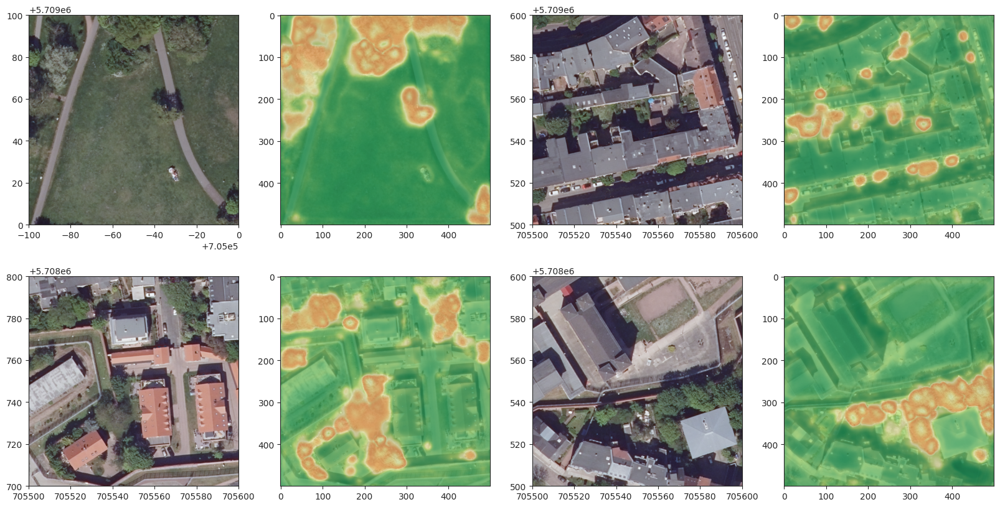

In [42]:
k = 4

fig, ax = plt.subplots(k // 2, k, figsize=(20, 10))
ax = ax.flatten()

idx = np.argsort(max_entropies)

for i in range(k):
    tile_id = re.search(r'(\d+_\d+)', emaps[idx[-(i + 1)]]).group()
    print(tile_id)
    raster = rasterio.open(f'/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/pool_tiles/tile_{tile_id}.tif')
    rastershow(raster, ax=ax[int(2*i)])

    blended = blend_raster_entropy_map(tile_id, pool_dir, cmap='RdYlGn_r')
    ax[int(2*i+1)].imshow(np.asarray(blended), vmin=0, vmax=255)

plt.savefig('./symposium_plots/pool_tiles_max_uncertain.png', bbox_inches='tight')


Some example plots to illustrate my slides

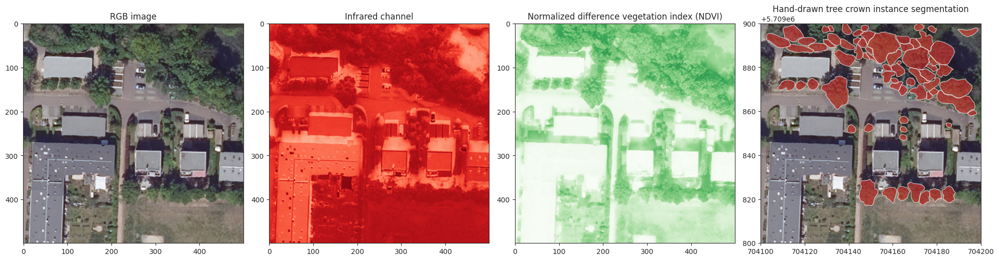

In [43]:
fig, ax = plt.subplots(1, 4, figsize=(20, 5), sharex=False, sharey=False)
example_tile = '/work/ka1176/shared_data/2024-ufz-deeptree/polygon-labelling/tiles/tile_1_1.tif'
raster = rioxarray.open_rasterio(example_tile).data
ax[0].imshow(raster[:3].transpose(1, 2, 0))
ax[1].imshow(raster[3], cmap='Reds', vmin=0, vmax=255)

ndvi = (raster[3]/255. - raster[0]/255.)/(raster[0] / 255. + raster[3] / 255.)

rastershow(rasterio.open(example_tile), ax=ax[3])
st = restrict_frame_to_raster(segmented_trees, rasterio.open(example_tile))
st.plot(ax=ax[3], facecolor='C3', alpha=0.6)

ax[2].imshow(ndvi, cmap='Greens', vmin=0, vmax=1)

ax[0].set_title('RGB image')
ax[1].set_title('Infrared channel')
ax[2].set_title('Normalized difference vegetation index (NDVI)')
ax[3].set_title('Hand-drawn tree crown instance segmentation')

fig.tight_layout()
plt.savefig('./symposium_plots/example_tile.png', bbox_inches='tight')

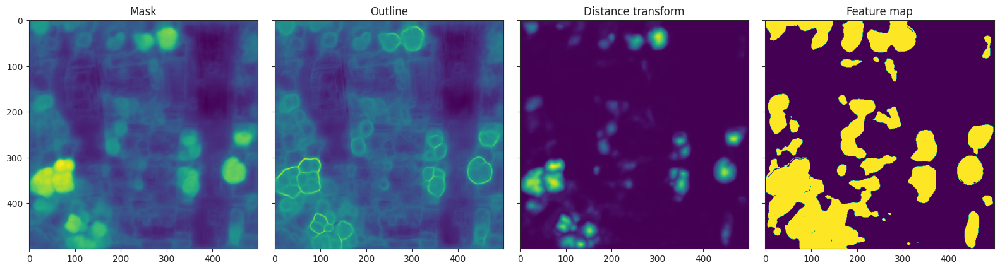

In [44]:
mask = rioxarray.open_rasterio('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-labeled-finetuned-halle/2024-11-27_14-39-31/predictions/mask_0_4.tif')
outl = rioxarray.open_rasterio('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-labeled-finetuned-halle/2024-11-27_14-39-31/predictions/outline_0_4.tif')
dist = rioxarray.open_rasterio('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-labeled-finetuned-halle/2024-11-27_14-39-31/predictions/distance_transform_0_4.tif')

fmap = calculate_feature_map(mask, outl, dist)

fig, ax = plt.subplots(1, 4, figsize=(16, 4), sharex=True, sharey=True)
ax[0].imshow(mask.data.squeeze(), cmap='viridis')
ax[1].imshow(outl.data.squeeze(), cmap='viridis')
ax[2].imshow(dist.data.squeeze(), cmap='viridis')
ax[3].imshow(fmap.squeeze(), cmap='viridis')

ax[0].set_title('Mask')
ax[1].set_title('Outline')
ax[2].set_title('Distance transform')
ax[3].set_title('Feature map')

fig.tight_layout()
plt.savefig('./symposium_plots/feature_map_example.png', bbox_inches='tight')

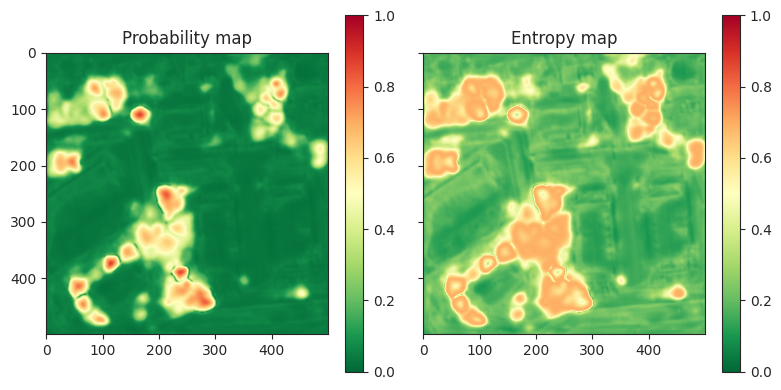

In [45]:
mask = rioxarray.open_rasterio('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-pool-finetuned-halle/2024-11-27_15-09-18/predictions/mask_15_12.tif')
outl = rioxarray.open_rasterio('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-pool-finetuned-halle/2024-11-27_15-09-18/predictions/outline_15_12.tif')
dist = rioxarray.open_rasterio('/work/ka1176/caroline/gitlab/deeptrees/outputs/results/inference-pool-finetuned-halle/2024-11-27_15-09-18/predictions/distance_transform_15_12.tif')

pmap = calculate_probability_map(mask, outl, dist)
emap = calculate_entropy(pmap.squeeze())

fig, ax = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
img = ax[0].imshow(pmap.squeeze(), cmap='RdYlGn_r', vmin=0, vmax=1)
plt.colorbar(img, ax=ax[0])

img = ax[1].imshow(emap.squeeze(), cmap='RdYlGn_r', vmin=0, vmax=1)
plt.colorbar(img, ax=ax[1])

ax[0].set_title('Probability map')
ax[1].set_title('Entropy map')

fig.tight_layout()
plt.savefig('./symposium_plots/probability_map_example.png', bbox_inches='tight')

In [46]:
!pwd -P

/work/ka1176/caroline/gitlab/deeptrees/notebooks/validation
